# Fourier transform

In this part, we look at the effect of filtering in Fourier space.

This gives us a different way of looking at images and yields deeper insights to what is going on when we apply a filter or downsample an image.

In [1]:
%matplotlib notebook
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.signal
import numpy as np
from scipy import ndimage
import cv2

## Some convenience functions

In [2]:
def imread_gray(filename):
    """Read grayscale image from our data directory."""
    return cv2.imread(filename, cv2.IMREAD_GRAYSCALE).astype(np.float32)

def convolve_with_two(image, kernel1, kernel2):
    """Apply two filters, one after the other."""
    image = ndimage.convolve(image, kernel1, mode='wrap')
    image = ndimage.convolve(image, kernel2, mode='wrap')
    return image

def fourier_spectrum(im):
    normalized_im = im / np.sum(im)
    f = np.fft.fft2(normalized_im)
    return np.fft.fftshift(f)

def log_magnitude_spectrum(im):
    return np.log(np.abs(fourier_spectrum(im))+1e-8)

def plot_with_spectra(images, titles):
    """Plots a list of images in the first column and the logarithm of their
    magnitude spectrum in the second column."""
    
    assert len(images) == len(titles)
    n_cols = 2
    n_rows = len(images)
    fig, axes = plt.subplots(
        n_rows, 2, figsize=(n_cols * 4, n_rows * 4),
        squeeze=False)

    spectra = [log_magnitude_spectrum(im) for im in images]

    lower = min(np.percentile(s, 0.1) for s in spectra)
    upper = min(np.percentile(s, 99.999) for s in spectra)
    normalizer = mpl.colors.Normalize(vmin=lower, vmax=upper)
    
    for ax, image, spectrum, title in zip(axes, images, spectra, titles):
        ax[0].imshow(image, cmap='gray')
        ax[0].set_title(title)
        ax[0].set_axis_off()
        c = ax[1].imshow(spectrum, norm=normalizer, cmap='viridis')
        ax[1].set_title('Log magnitude spectrum')
        ax[1].set_axis_off()
        
    fig.tight_layout()
    
def generate_pattern():
    x = np.linspace(0, 1, 256, endpoint=False)
    y = np.sin(x**2 * 16 * np.pi)
    return np.outer(y,y)/2+0.5

im_grass = imread_gray('grass.jpg')
im_zebras = imread_gray('zebras.jpg')
im_pattern = generate_pattern()

## Plotting demo

<IPython.core.display.Javascript object>


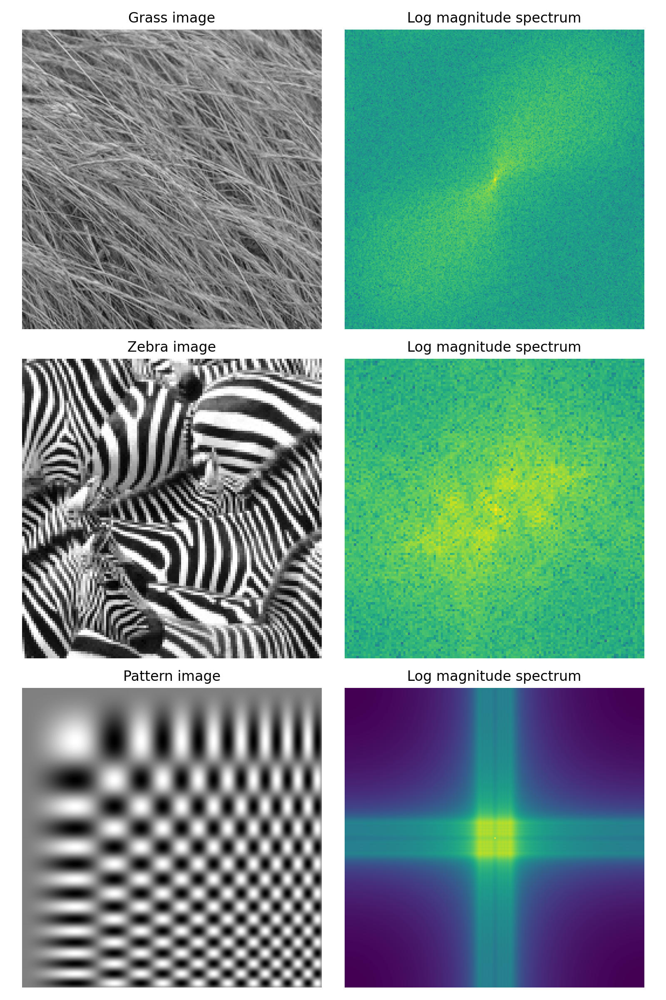

In [3]:
plot_with_spectra([im_grass, im_zebras, im_pattern], ['Grass image', 'Zebra image', 'Pattern image'])

## Blurring

The method `filter_box(image, size)` that outputs the box-filtered version of `image`, using `convolve_with_two` (since the box filter is separable). The parameter `size` refers to the side length of the box filter.

The method `filter_gauss(image, kernel_factor, sigma)` using `convolve_with_two`. The parameter `kernel_factor` defines the half size of the kernel relative to sigma.

<IPython.core.display.Javascript object>


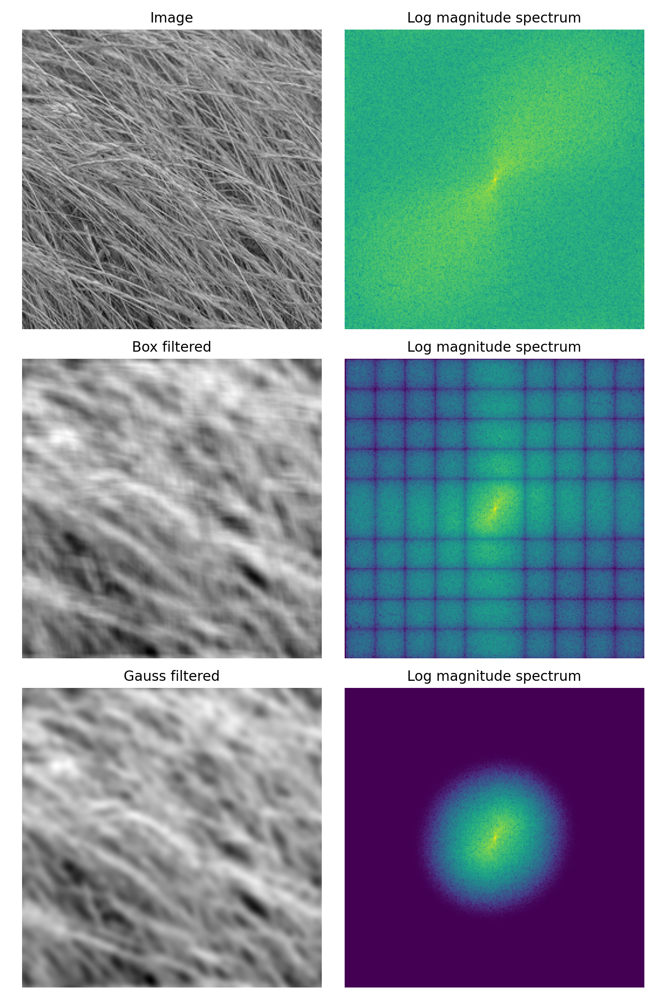

In [ ]:
def gauss(x, sigma):
    return 1 / np.sqrt(2 * np.pi) / sigma * np.exp(- x**2 / 2 / sigma**2)

def filter_gauss(image, kernel_factor, sigma):

    kernel_halfwidth = int(kernel_factor * sigma)
    x = np.arange(-kernel_halfwidth, kernel_halfwidth + 1)[np.newaxis]
    G = gauss(x, sigma)
    return convolve_with_two(image, G, G.T)


def filter_box(image, sigma):

    side = int(round(sigma * 12**0.5))
    B = np.full([1, side], 1/side)
    return convolve_with_two(image, B, B.T)

    
import scipy.signal
def filter_box(image, sigma):
    side = int(round(sigma * 12**0.5))
    B = np.full([1, side], 1/side)
    B_2d = scipy.signal.convolve2d(B, B.T, mode='full')
    return scipy.signal.convolve2d(image, B_2d, mode='same', boundary='wrap')

sigma = 3
im = im_grass
gauss_filtered = filter_gauss(im, kernel_factor=6, sigma=sigma)
box_filtered = filter_box(im, sigma=sigma)
plot_with_spectra(
    [im, box_filtered, gauss_filtered], 
    ['Image', 'Box filtered', 'Gauss filtered'])

## Sampling and aliasing

A function `sample_with_gaps(image, period)` is implemented, where `period` is an integer and defines the distance between two sampled points in pixels. The output has the same size as `image` but have zeros everywhere except at the sampled points, where it is equal to `image`. For example if `period=2` then every second row and every second column of the image is zero in the output.

Using `sample_with_gaps`, `im_zebras` image is sampled with a period of 2 pixels and the original and sampled images are plotted along with their spectra.

Another function `sample_without_gaps(image, period)` is implemented, which is like `sample_with_gaps` but the output does not contain gaps (rows and columns of zeros) and therefore the output size is smaller.

<IPython.core.display.Javascript object>


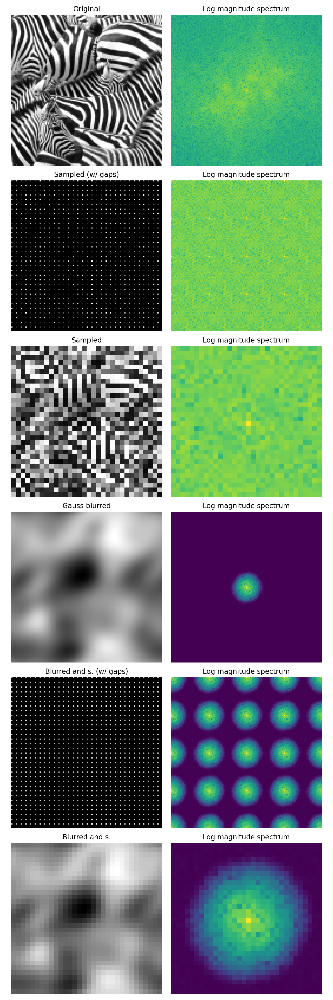

In [ ]:
N=4
def sample_with_gaps(im, period):
    out = np.zeros_like(im)
    out[::period, ::period] = im[::period, ::period]
    return out

def sample_without_gaps(im, period):
    return im[::period, ::period]

im = im_zebras
sampled_gaps = sample_with_gaps(im, N)
sampled = sample_without_gaps(im, N)

blurred = filter_gauss(im, kernel_factor=6, sigma=8)
blurred_and_sampled_gaps = sample_with_gaps(blurred, N)
blurred_and_sampled = sample_without_gaps(blurred, N)

plot_with_spectra(
    [im, sampled_gaps, sampled, blurred, blurred_and_sampled_gaps, blurred_and_sampled], 
    ['Original', 'Sampled (w/ gaps)', 'Sampled', 'Gauss blurred', 'Blurred and s. (w/ gaps)', 'Blurred and s.'])

The image `im_pattern` is sampled with a period of 4, 8 and 16 and plotted with the resulting spectra.

<IPython.core.display.Javascript object>


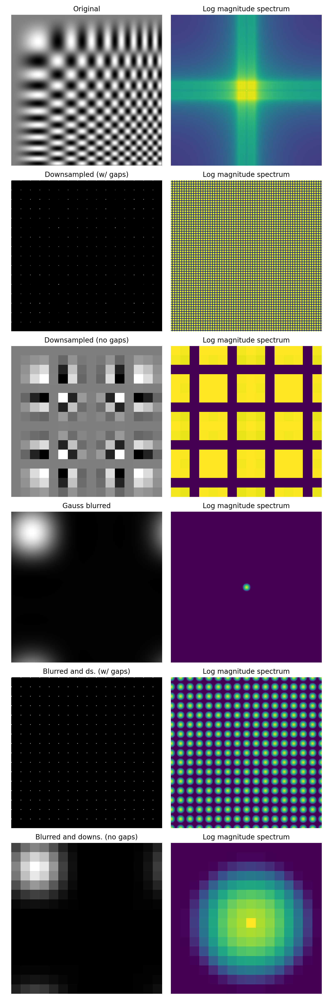

In [8]:
N=16
image = im_pattern
downsampled_gaps = sample_with_gaps(im_pattern, N)
downsampled = sample_without_gaps(im_pattern, N)

blurred = filter_gauss(image, kernel_factor=6, sigma=32)
blurred_and_downsampled_gaps = sample_with_gaps(blurred, N)
blurred_and_downsampled = sample_without_gaps(blurred, N)

plot_with_spectra(
    [im_pattern, downsampled_gaps, downsampled, blurred, blurred_and_downsampled_gaps, blurred_and_downsampled], 
    ['Original', 'Downsampled (w/ gaps)', 'Downsampled (no gaps)', 'Gauss blurred', 'Blurred and ds. (w/ gaps)', 'Blurred and downs. (no gaps)'])